# CS7GV1 FINAL ASSIGNMENT

In this assignment you will be asked to implement a [Generative Adversarial Network (GAN)](https://proceedings.neurips.cc/paper/2014/file/5ca3e9b122f61f8f06494c97b1afccf3-Paper.pdf), more precisely a [Deep Convolutional Generative Adversarial Network (DCGAN)](https://arxiv.org/pdf/1511.06434.pdf), to generate images of clothes by training the networks on the [Fashion MNIST dataset](https://github.com/zalandoresearch/fashion-mnist).

Instructions and questions are presented directly in this notebook, please answer the questions in the notebook in the specified text boxes. When submitting your assignment, please submit in a single .zip file:
- This completed notebook
- The checkpoint file where your model and other variables are saved
- The tensorboard events file

Do not submit the dataset files.

In [ ]:
# Please add your name and student number below.
studentName = "Yahong Zhu"
studentNumber = 21333370

# Step 1: Import the libraries (0.5 point)

You will need the same libraries as used in the labs.

In [ ]:
# Import the libraries here
# *Write your code here*
import cv2
%matplotlib inline
import matplotlib.pyplot as plt
import os
import numpy as np
import torch
import torch.nn as nn
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
from torchvision import datasets
from torch.utils.data import DataLoader
import random
import torch.optim as optim
import torchvision.utils as vutils

In [ ]:
# Define device
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print("Running on " + str(device))

Running on cpu


In [ ]:
# Mount your google drive here to make sure the saved data is not lost
mydrive = '/content/gdrive/'
from google.colab import drive
drive.mount(mydrive)
working_dir = mydrive + 'MyDrive/Final_assignment/'
# working_dir = './' # To save data locally, will get deleted when this runtime is recycled!
if not(os.path.isdir(working_dir)):
    os.makedirs(working_dir)

Mounted at /content/gdrive/


# Step 2: Load the dataset (1 point)

For this assignment, use the FashionMNIST dataset.

In [ ]:
# Define the transforms to be applied to the training data. In order:
# - resize images to size 32x32
# - convert to tensor
# - normalize with mean 0.5 and standard deviation of 0.5
# *Write your code here*
transform = transforms.Compose([
    transforms.CenterCrop(32),
    transforms.ToTensor(),
    transforms.Normalize((0.5,),(0.5,))])
# Download the training dataset
# *Write your code here*
train_data = datasets.FashionMNIST(root='./',train=True, download=True, transform=transform)
# Create the dataloader with a batch size of 64 and 2 workers
# *Write your code here*
batchsize = 64
train_dataloader = DataLoader(train_data, batch_size=batchsize,num_workers=2)
classes = ('T-shirt/top', 'Trouser', 'Pullover', 'Dress', 'Coat',
        'Sandal', 'Shirt', 'Sneaker', 'Bag', 'Ankle Boot')

  0%|          | 0/26421880 [00:00<?, ?it/s]

Extracting ./FashionMNIST/raw/train-images-idx3-ubyte.gz to ./FashionMNIST/raw



  0%|          | 0/29515 [00:00<?, ?it/s]

Extracting ./FashionMNIST/raw/train-labels-idx1-ubyte.gz to ./FashionMNIST/raw



  0%|          | 0/4422102 [00:00<?, ?it/s]

Extracting ./FashionMNIST/raw/t10k-images-idx3-ubyte.gz to ./FashionMNIST/raw



  0%|          | 0/5148 [00:00<?, ?it/s]

Extracting ./FashionMNIST/raw/t10k-labels-idx1-ubyte.gz to ./FashionMNIST/raw



# Step 3: Visualize the data (1 point)

Display a 8x8 grid of training images.

60000


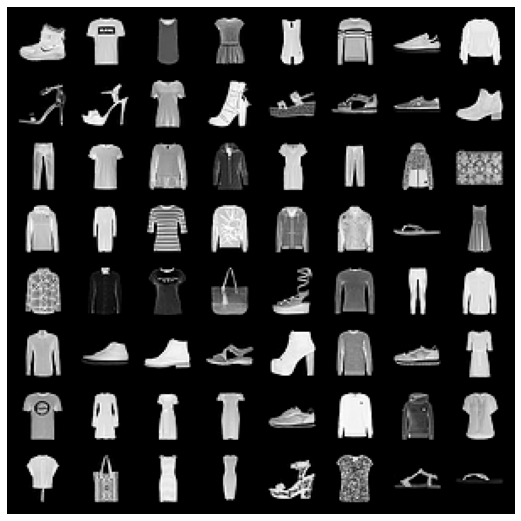

In [ ]:
# Plot some training images in a 8x8 grid
# *Write your code here*
print(len(train_data))
labels_map = {
    0: "T-Shirt",
    1: "Trouser",
    2: "Pullover",
    3: "Dress",
    4: "Coat",
    5: "Sandal",
    6: "Shirt",
    7: "Sneaker",
    8: "Bag",
    9: "Ankle Boot",
}
real_image = next(iter(train_dataloader))
figure = plt.figure(figsize=(20, 20))

plt.subplot(1,2,1)
plt.axis("off")
plt.imshow(np.transpose(vutils.make_grid(real_image[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))
plt.show()

# Question 3: Comment about the input data (0.5 point)

The input data consist of 60,000 examples. They are grayscale clothes images with same size 32*32 and each of them has a label in 10 different classes.


# Step 4: Define the networks

Define a Generator and a Discriminator network, and instantiate them by applying the ``weights_init`` function given below.
Use a latent vector z of size 100. 


In [ ]:
# Custom weights initialization called on generator and discriminator, 
# which randomly initialize all weights to mean=0, stdev=0.02.
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

# Step 4.1: Define the generator (3 points)

In [ ]:
# Define the generator network with the following structure:
# Generator(
    # (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    # (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    # (2): ReLU(inplace=True)
    # (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    # (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    # (5): ReLU(inplace=True)
    # (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    # (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    # (8): ReLU(inplace=True)
    # (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    # (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    # (11): ReLU(inplace=True)
    # (12): Conv2d(64, 1, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    # (13): Tanh()
# )

class Generator(nn.Module):
    # *Write your code here*
     def __init__(self):
        super(Generator, self).__init__()
        self.main = nn.Sequential(
          nn.ConvTranspose2d(100, 512, (4, 4), stride=(1, 1), bias=False),
          nn.BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
          nn.ReLU(inplace=True),
          nn.ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False),
          nn.BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
          nn.ReLU(inplace=True),
          nn.ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False),
          nn.BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
          nn.ReLU(inplace=True),
          nn.ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False),
          nn.BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
          nn.ReLU(inplace=True),
          nn.Conv2d(64, 1, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False),
          nn.Tanh()
        )
     def forward(self, input):
        return self.main(input)

# Define the generator network netG, and instantiate using the weights_init function.
netG = Generator().to(device)
netG.apply(weights_init)
print(netG)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): Conv2d(64, 1, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


# Question 4.1: What can you say about the structure of the generator network? (0.5 point)

The input of generater network is a latent space vetor with size 100. The network consists of 4 two dimensional convolutional transpose layers, 3 of them are 2 strided to upsampling the input. Each convolutional transpose layers follows with a 2d batch normalization layer and a relu activation function. It also consists of a 2d convolutional layer and a Tanh function for mapping the input to the range of -1 to 1. The outputs of this generator network are images with the same size of training images.

# Step 4.2: Define the discriminator (3 points)

In [ ]:
# Define the discriminator network with the following structure:
# Discriminator(
    # (0): Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    # (1): LeakyReLU(negative_slope=0.2, inplace=True)
    # (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    # (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    # (4): LeakyReLU(negative_slope=0.2, inplace=True)
    # (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    # (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    # (7): LeakyReLU(negative_slope=0.2, inplace=True)
    # (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    # (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    # (10): LeakyReLU(negative_slope=0.2, inplace=True)
    # (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    # (12): Sigmoid()
# )

class Discriminator(nn.Module):
  # *Write your code here*
  def __init__(self):
    super(Discriminator, self).__init__()
    self.main = nn.Sequential(
      nn.Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False),
      nn.LeakyReLU(negative_slope=0.2, inplace=True),
      nn.Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False),
      nn.BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
      nn.LeakyReLU(negative_slope=0.2, inplace=True),
      nn.Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False),
      nn.BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
      nn.LeakyReLU(negative_slope=0.2, inplace=True),
      nn.Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False),
      nn.BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
      nn.LeakyReLU(negative_slope=0.2, inplace=True),
      nn.Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False),
      nn.Sigmoid()
    )
  def forward(self, input):
    return self.main(input)
# Define the generator network netG, and instantiate using the weights_init function.
netD = Discriminator().to(device)
netD.apply(weights_init)

Discriminator(
  (main): Sequential(
    (0): Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)

# Question 4.2: What can you say about the structure of the discriminator network? (0.5 point)

The input of the discriminator network is image. The discriminator is a binary classification convolutional neural network with 5 2d convolutional layers. The first convolutional layer is an input layer with a LeakyReLU activation function. The next 3 2d convolutional layers with 2 strides, followed by a 2d batch normalization layer and a LeakyReLU activation function. The last convolutional layer processes the input into 1 channel output. The followed Sigmoid function output the probabilities of real and fake of the input image.

# Step 5: Define the Loss Function and Optimizers (5 points)

Hint: look at existing papers and online tutorials to find which loss function, optimizer, and hyper parameters should be used to train a GAN.
Define an optimizer for each generator and discriminator network.

In [ ]:
# Initialize the loss function
# *Write your code here*
#Binary Cross Entropy loss
lossFunc = nn.BCELoss()
# Setup optimizers for both netG and netD
# *Write your code here*
optimizerG = optim.Adam(netG.parameters(),lr=0.0002,betas=(0.5,0.999))
optimizerD = optim.Adam(netD.parameters(),lr=0.0002,betas=(0.5,0.999))

In [ ]:
# Establish convention for real and fake labels during training
real_label = 1.
fake_label = 0.

# Create batch of latent vectors that we will use to visualize
# the progression of the generator
#Size of z latent vector
nz=100
random.seed(studentNumber) # Fix the random seed to be able to reproduce the results
torch.manual_seed(studentNumber)
fixed_noise = torch.randn(8*8, nz, 1, 1, device=device)

# Question 5: Explain here how the GAN losses works. (1 point)
To train the GAN, we use the Binary Cross Entropy loss function and Adam optimizer with learning rate=0.0002 and initial Beta=0.5 for both the generater and the discriminator network. The loss function measures the distance between the distribution of the real images and the distribution of the fake images which are generated by the generater.

The formula of the loss function is log(D(x))+log(1 - D(G(z)))

In BCELoss function, instead of calculate log(1 - D(G(z))), the generator uses log(D(G(z))).

During the training process, the generator tries to minimize log(D(G(z))) while the discriminator tries to maximize log(D(x))+log(1 - D(G(z))). 

# Step 6: Display the outputs of the generator and discriminator before training (1 point)

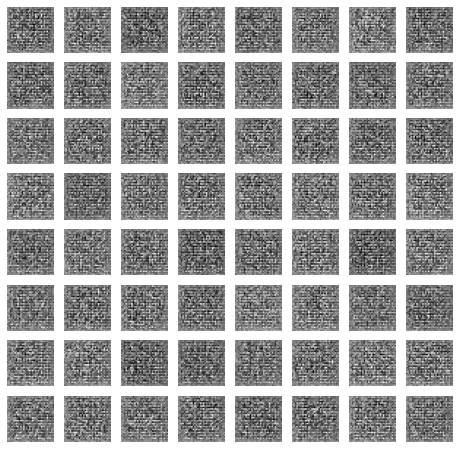

probabilities: tensor([1.3680e-05, 3.2984e-05, 1.0223e-05, 3.1519e-05, 8.8795e-05, 1.1308e-05,
        3.8502e-06, 4.5431e-05, 1.4507e-03, 1.5753e-05, 7.8973e-06, 1.1015e-05,
        2.9395e-05, 1.9690e-06, 6.3425e-05, 9.2070e-05, 7.7971e-07, 3.5020e-06,
        2.0339e-04, 1.5885e-05, 3.3440e-05, 1.4555e-05, 2.5794e-06, 2.3064e-05,
        6.7561e-05, 8.7483e-04, 1.3720e-05, 2.9244e-05, 4.1616e-05, 2.3251e-05,
        8.6404e-05, 2.0349e-04, 1.3847e-05, 8.1093e-06, 5.2407e-04, 2.0209e-05,
        1.5325e-06, 6.3710e-05, 3.0121e-05, 4.2628e-06, 2.1590e-04, 2.3558e-04,
        3.2247e-06, 7.9194e-05, 7.9720e-06, 1.7414e-05, 1.0010e-05, 4.6705e-05,
        6.4813e-06, 2.5921e-05, 1.2381e-06, 1.5814e-05, 5.2048e-05, 4.7073e-05,
        5.4483e-04, 7.1415e-07, 3.4688e-06, 8.9875e-05, 1.8771e-05, 6.1808e-06,
        5.2065e-05, 8.4432e-06, 1.5406e-04, 1.7964e-04],
       grad_fn=<ViewBackward0>)


In [ ]:
# Use the batch of 64 latent vectors created above as input to the generator 
# and visualize the output in a 8x8 grid
# *Write your code here*
fake = netG(fixed_noise)
viewimg = fake.detach().numpy()
figure = plt.figure(figsize=(8, 8))
cols, rows = 8,8
for i in range(0, cols * rows):
    img = viewimg[i]
    figure.add_subplot(rows, cols, i+1)
    plt.axis("off")
    plt.imshow(img.squeeze(), cmap="gray")
plt.show()
# Use the 64 images just generated as input to the discriminator
# and print the output probabilities
# *Write your code here*
output = netD(fake).view(-1)
print("probabilities:",output)

# Step 7: Train the network (10 points)

Training a GAN can take time. It is recommended that you save your model regularly so you can resume training later if needed, and use Tensor Board to monitor the progress of the training. If you choose the right parameters, you should observe shapes of clothes emerging before the end of the first epoch. Use at least 1 or 2 epochs, each epoch can take ~1h.


In [ ]:
# Create a SummaryWriter using tensorboard.
from torch.utils.tensorboard import SummaryWriter
writer = SummaryWriter(working_dir + 'runs/')

# Load the TensorBoard notebook extension
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [ ]:
# load tensorboard in this cell
# You will need to run this cell again or use the TensorBoard refresh to view new changes throughout the notebook.
%tensorboard --logdir=/content/gdrive/MyDrive/Final_assignment/runs

<IPython.core.display.Javascript object>

In [ ]:
from torch.nn.modules.container import ModuleList
# Training Loop
# Use at least 1 to 2 epochs.
# If you choose the right parameters, you should observe shapes of clothes emerging 
# before the end of the first epoch.
num_epochs = 2

# In addition to TensorBoard, use these lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
model_G_path = working_dir + 'modelG'
model_D_path = working_dir + 'modelD'
# Reload your saved models from previous training iterations here
# (see https://pytorch.org/tutorials/beginner/saving_loading_models.html)
checkpoint_path = working_dir + 'checkpoint'
if os.path.isfile(checkpoint_path):
    checkpoint = torch.load(checkpoint_path)
    netG.load_state_dict(checkpoint['netG_model'])
    netD.load_state_dict(checkpoint['netD_model'])
    optimizerG.load_state_dict(checkpoint['optimizerG_state_dict'])
    optimizerD.load_state_dict(checkpoint['optimizerD_state_dict'])
    errG = checkpoint['errG']
    errD_real = checkpoint['errD_real']
    errD_fake = checkpoint['errD_fake']
    iters = checkpoint['iters']
    start_epoch = checkpoint['epoch']
    img_list = checkpoint['img_list']
    G_losses = checkpoint['G_losses']
    D_losses = checkpoint['D_losses']

else:
  iters = 0
  start_epoch = 0


print("Starting Training Loop from epoch " + str(start_epoch))
for epoch in range(start_epoch, num_epochs):
    for i, data in enumerate(train_dataloader, 0):
        # Update the discriminator
        # *Write your code here*
        netD.zero_grad()
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        output = netD(real_cpu).view(-1)
        errD_real = lossFunc(output, label)
        errD_real.backward()
        D_x = output.mean().item()

        noise = torch.randn(b_size, nz, 1, 1, device=device)
        fake = netG(noise)
        label.fill_(fake_label)
        output = netD(fake.detach()).view(-1)
        errD_fake = lossFunc(output, label)
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        errD = errD_real + errD_fake
        optimizerD.step()


        # Update the generator
        # *Write your code here*

        netG.zero_grad()
        label.fill_(real_label)  
        output = netD(fake).view(-1)
        errG = lossFunc(output, label)
        errG.backward()
        D_G_z2 = output.mean().item()
        optimizerG.step()


        # Output training stats every 50 iterations (you can change this number if needed)
        if i % 50 == 0:
            # Print the current epoch, the current batch iteration, discriminator and generator losses,
            # the average probability output of the discriminator after the update 
            # of the discriminator trained with all-real batch, trained with all-fake batch,
            # abd after the update of the generator
            # *Write your code here*
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(train_dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

            # Log the generator loss here (tensorboard + append to G_losses)
            # *Write your code here*
            G_losses.append(errG.item())
            val_G = errG.item()
            writer.add_scalar('generator loss',val_G,i)   
            # Log the discriminator loss here (tensorboard + append to D_losses)
            # *Write your code here*
            D_losses.append(errD.item())
            val_D = errD.item()  
            writer.add_scalar('discriminator loss',val_D,i)   
            # Check how the generator is doing by visualizing G's output on fixed_noise
            # (tensorboard + append in img_list)
            # *Write your code here*
            if (iters % 200 == 0):
              with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
              img_list.append(vutils.make_grid(fake, padding=2, normalize=True))
              img_fake = torchvision.utils.make_grid(fake)
              writer.add_image('visualize images', img_fake, 0)  
            iters += 1
            # Save the checkpoint here, which can be used to resume training later.
            # (see https://pytorch.org/tutorials/beginner/saving_loading_models.html)
            torch.save({
              'epoch': epoch,
              'iters': iters,
              'netG_model': netG.state_dict(),
              'netD_model': netD.state_dict(),
              'optimizerG_state_dict': optimizerG.state_dict(),
              'optimizerD_state_dict': optimizerD.state_dict(),
              'errG': errG,
              'errD_real': errD_real,
              'errD_fake': errD_fake,
              'img_list': img_list,
              'G_losses': G_losses,
              'D_losses': D_losses
            }, checkpoint_path)
        iters += 1
print('Finished Training')
writer.close()
# Save the models and stats after training
# *Write your code here*
torch.save(netG, model_G_path)
torch.save(netD, model_D_path)

Starting Training Loop from epoch 1
[1/2][0/938]	Loss_D: 0.0004	Loss_G: 9.6869	D(x): 0.9999	D(G(z)): 0.0003 / 0.0003
[1/2][50/938]	Loss_D: 0.0003	Loss_G: 10.8077	D(x): 0.9998	D(G(z)): 0.0001 / 0.0001
[1/2][100/938]	Loss_D: 0.0004	Loss_G: 9.6232	D(x): 0.9999	D(G(z)): 0.0003 / 0.0003
[1/2][150/938]	Loss_D: 0.0003	Loss_G: 9.9942	D(x): 0.9998	D(G(z)): 0.0001 / 0.0001
[1/2][200/938]	Loss_D: 0.0002	Loss_G: 10.6000	D(x): 0.9999	D(G(z)): 0.0001 / 0.0001
[1/2][250/938]	Loss_D: 0.0004	Loss_G: 9.6719	D(x): 0.9998	D(G(z)): 0.0002 / 0.0002
[1/2][300/938]	Loss_D: 0.0003	Loss_G: 10.5087	D(x): 0.9998	D(G(z)): 0.0001 / 0.0001
[1/2][350/938]	Loss_D: 0.0007	Loss_G: 9.0568	D(x): 0.9999	D(G(z)): 0.0006 / 0.0005
[1/2][400/938]	Loss_D: 0.0002	Loss_G: 11.1995	D(x): 0.9998	D(G(z)): 0.0000 / 0.0000
[1/2][450/938]	Loss_D: 0.0001	Loss_G: 10.9808	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[1/2][500/938]	Loss_D: 0.0005	Loss_G: 9.7521	D(x): 0.9997	D(G(z)): 0.0002 / 0.0002
[1/2][550/938]	Loss_D: 0.0005	Loss_G: 11.7985	D(x

# Question 7: Comment on the training process. (1 point)
*Look at the generator and discriminator losses over iterations. Comment on the the discriminator output probability when fed real or fake images as input and the evolution of these probabilities over time.*

After 3 epoch, the discriminator losses decreases and converges to approx 0.0003. The probability of the discriminater increases through the training process and stays at 0.9999.

The generator losses oscillates and decreases  through iterations before 60 and collapsed after 60 iterations. The generator losses started to increase and reach approx 10. From my observation, the reason why it happens is because we continue training GAN over the point and the discriminator starts to output randomly, meanwhile the generator is trained on this random feedback and the model collapse. The training process should be stoped at around 60 iterations, otherwise the performance of this model would start to get worse. Also, the model needs to be tuned to achieve better performance. Overall, the training process shows loss of the GAN is often oscillated and converge at a point in iterations, then the model starts to collapse.



# Step 8: Display results (1 point)

Load saved models and results.

In [ ]:
# Load the relevant models and stats from the checkpoint file
# *Write your code here*
generatorM = Generator()
discriminatorM = Discriminator()

checkpoint = torch.load(checkpoint_path)
generatorM.load_state_dict(checkpoint['netG_model'])
discriminatorM.load_state_dict(checkpoint['netD_model'])
G_losses = checkpoint['G_losses']
D_losses = checkpoint['D_losses']
generatorM.eval()
discriminatorM.eval()

Discriminator(
  (main): Sequential(
    (0): Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)

Plot the generator and discriminator losses.

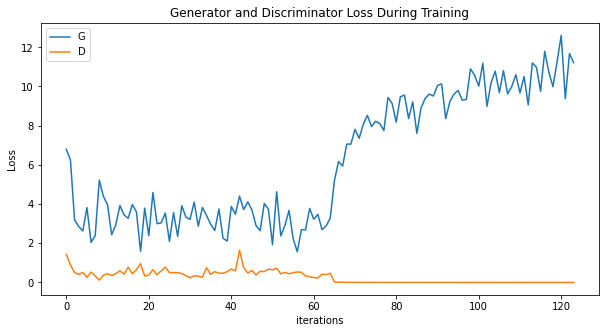

In [ ]:
 # *Write your code here*
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

Visualize generator progression

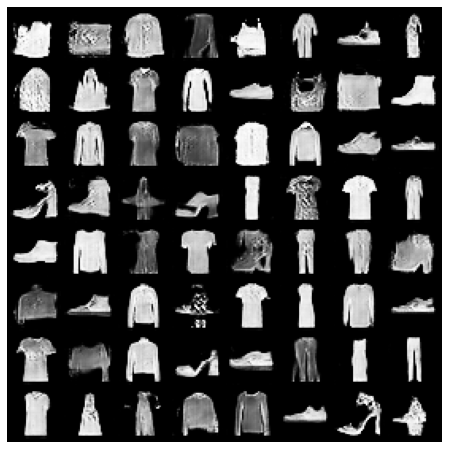

In [ ]:
# Animate images generated over epochs
import matplotlib.animation as animation
from IPython.display import HTML

fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

Compare real images and generated images

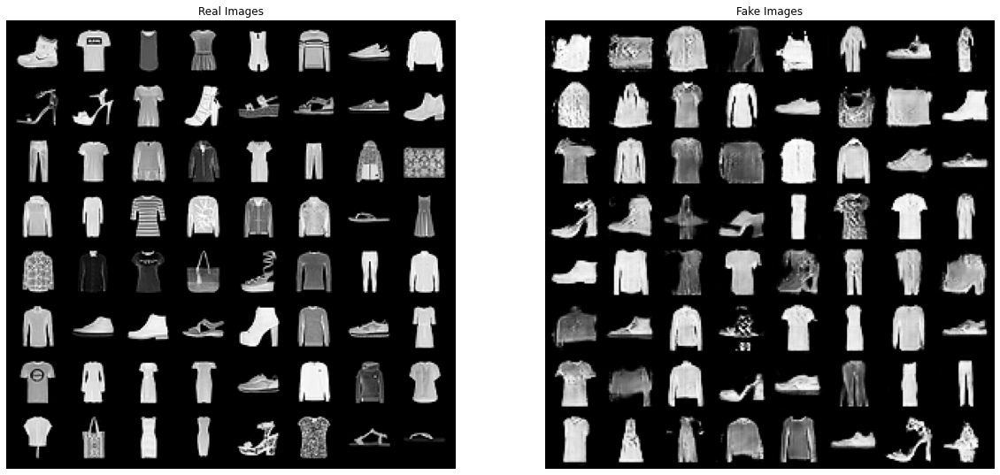

In [ ]:
# Load real images from the dataloader and plot them in a 8x8 grid
# *Write your code here*
real_image = next(iter(train_dataloader))
figure = plt.figure(figsize=(20, 20))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_image[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Generate and plot fake images in a 8x8 grid side by side with the real images 
# *Write your code here*
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()

# Question 8: Comment on your results. (1 point)

Compare the real images and the fake images above, we can see they are almost similar to each other. We can recognize the categories for example, sandals, sneakers, dresses and T-shirts, etc. It is distinguishable for human to tell the difference between the real and the fake images, but the results are not completely authentic and neat due to the collapse of the model. Overall the generator produced some images that are relatively similar to the real images and the results show it learned most of the features from the real images during the training process.